In [1]:
import numpy as np
import pandas as pd
import os
import glob
import itertools
import scanpy as sc
import natsort
import json

import matplotlib.pyplot as plt
import seaborn as sns

from scroutines import basicu
from scroutines import powerplots

import scanpy.external as sce


In [2]:
ddir = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_dev_merged'
!ls $ddir

bigtensor_cheng22_subclass_v2.json  bigtensor_yoo25_subclass_v2.npy
bigtensor_cheng22_subclass_v2.npy   cheng22_astro.h5ad
bigtensor_gao25_subclass.json	    gao25_astro.h5ad
bigtensor_gao25_subclass.npy	    yoo25_astro.h5ad
bigtensor_yoo25_subclass_v2.json


In [3]:
adata1 = sc.read(os.path.join(ddir, 'cheng22_astro.h5ad'))
adata2 = sc.read(os.path.join(ddir, 'gao25_astro.h5ad'))
adata3 = sc.read(os.path.join(ddir, 'yoo25_astro.h5ad'))

print(adata1)
print(adata2)
print(adata3)

AnnData object with n_obs × n_vars = 19362 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'biosample'
AnnData object with n_obs × n_vars = 13766 × 32285
    obs: 'Unnamed: 0', 'subcluster_id', 'subcluster_label', 'cluster_label', 'subclass_label', 'class_label', 'subcluster_prob', 'cluster_probability', 'subclass_probability', 'class_probability', 'library_prep', 'roi', 'sex', 'donor_name', 'age_label', 'cellNames'
AnnData object with n_obs × n_vars = 14028 × 16572
    obs: 'Age', 'Doublet', 'Doublet Score', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'Class', 'Sample', 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts_mt', 'Doublet?', 'Study', 'Type_leiden', 'cond', 'biosample'
    var: 'feature_types'


# select shared genes

In [4]:
import re

In [5]:
# shared and normal genes
genes_overlap = np.intersect1d(adata1.var.index.values, adata2.var.index.values)
genes_overlap = np.intersect1d(genes_overlap, adata3.var.index.values)
print(genes_overlap.shape)

# remove mitochondrial genes 
mask = np.char.startswith(genes_overlap.astype(str), 'mt-')
genes_overlap = genes_overlap[~mask]
print(genes_overlap.shape)

# remove 'a'
pattern = re.compile(r'^[a-z]')
mask = np.array([bool(pattern.match(s)) for s in genes_overlap.astype(str)])
genes_overlap = genes_overlap[~mask]
print(genes_overlap.shape)
genes_overlap

(16570,)
(16558,)
(16557,)


array(['0610005C13Rik', '0610009B22Rik', '0610009E02Rik', ..., 'Zyx',
       'Zzef1', 'Zzz3'], dtype=object)

In [6]:
adata1 = adata1[:,genes_overlap]
adata2 = adata2[:,genes_overlap]
adata3 = adata3[:,genes_overlap]

print(adata1)
print(adata2)
print(adata3)

View of AnnData object with n_obs × n_vars = 19362 × 16557
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'biosample'
View of AnnData object with n_obs × n_vars = 13766 × 16557
    obs: 'Unnamed: 0', 'subcluster_id', 'subcluster_label', 'cluster_label', 'subclass_label', 'class_label', 'subcluster_prob', 'cluster_probability', 'subclass_probability', 'class_probability', 'library_prep', 'roi', 'sex', 'donor_name', 'age_label', 'cellNames'
View of AnnData object with n_obs × n_vars = 14028 × 16557
    obs: 'Age', 'Doublet', 'Doublet Score', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'Class', 'Sample', 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts_mt', 'Doublet?', 'Study', 'Type_leiden', 'cond', 'biosample'
    var: 'feature_types'


# select adult stage samples

In [7]:
adata1.obs['cond'] = adata1.obs['biosample'].apply(lambda x: ''.join(x.split('_')[:-1]).upper()) # .biosample.cat.categories

/tmp/ipykernel_231017/3883529802.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata1.obs['cond'] = adata1.obs['biosample'].apply(lambda x: ''.join(x.split('_')[:-1]).upper()) # .biosample.cat.categories


In [8]:
adata1_adlt = adata1[adata1.obs['cond'].isin(['P28', 'P38'])]
adata1_adlt

View of AnnData object with n_obs × n_vars = 3653 × 16557
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'biosample', 'cond'

In [9]:
adata2_adlt = adata2[adata2.obs['age_label'].isin(['P56', 'P58'])]
adata2_adlt

View of AnnData object with n_obs × n_vars = 3390 × 16557
    obs: 'Unnamed: 0', 'subcluster_id', 'subcluster_label', 'cluster_label', 'subclass_label', 'class_label', 'subcluster_prob', 'cluster_probability', 'subclass_probability', 'class_probability', 'library_prep', 'roi', 'sex', 'donor_name', 'age_label', 'cellNames'

In [10]:
adata3_adlt = adata3[adata3.obs['Age'].isin(['P21'])]
adata3_adlt

View of AnnData object with n_obs × n_vars = 884 × 16557
    obs: 'Age', 'Doublet', 'Doublet Score', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'Class', 'Sample', 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts_mt', 'Doublet?', 'Study', 'Type_leiden', 'cond', 'biosample'
    var: 'feature_types'

In [16]:
adata1_adlt.obs['uType'] = adata1_adlt.obs['Type']
adata2_adlt.obs['uType'] = adata2_adlt.obs['cluster_label']
adata3_adlt.obs['uType'] = adata3_adlt.obs['Type']

/tmp/ipykernel_231017/1394416778.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata2_adlt.obs['uType'] = adata2_adlt.obs['cluster_label']
/tmp/ipykernel_231017/1394416778.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata3_adlt.obs['uType'] = adata3_adlt.obs['Type']


In [19]:
# Combine into a single object with a 'batch' column
adata_merged = {'ds1': adata1_adlt, 
                'ds2': adata2_adlt, 
                'ds3': adata3_adlt,}

adata_merged = sc.concat(adata_merged, label='dataset') # , join='outer')

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/anndata/_core/merge.py:1111: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [21]:
sc.pp.normalize_total(adata_merged, target_sum=1e4)
sc.pp.log1p(adata_merged)
sc.pp.highly_variable_genes(adata_merged, batch_key='dataset') # HVGs per batch
adata_merged = adata_merged[:, adata_merged.var.highly_variable].copy()

# sc.pp.scale(adata_merged, max_value=10)
sc.pp.pca(adata_merged)
adata_merged

AnnData object with n_obs × n_vars = 7927 × 2794
    obs: 'uType', 'dataset'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [23]:
sce.pp.harmony_integrate(adata_merged, key='dataset')

# Use 'X_pca_harmony' for neighbors/UMAP
sc.pp.neighbors(adata_merged, use_rep='X_pca_harmony', n_neighbors=30)

2026-02-09 15:18:19,658 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-02-09 15:18:22,162 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-02-09 15:18:22,234 - harmonypy - INFO - Iteration 1 of 10
2026-02-09 15:18:23,774 - harmonypy - INFO - Iteration 2 of 10
2026-02-09 15:18:25,369 - harmonypy - INFO - Converged after 2 iterations


/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


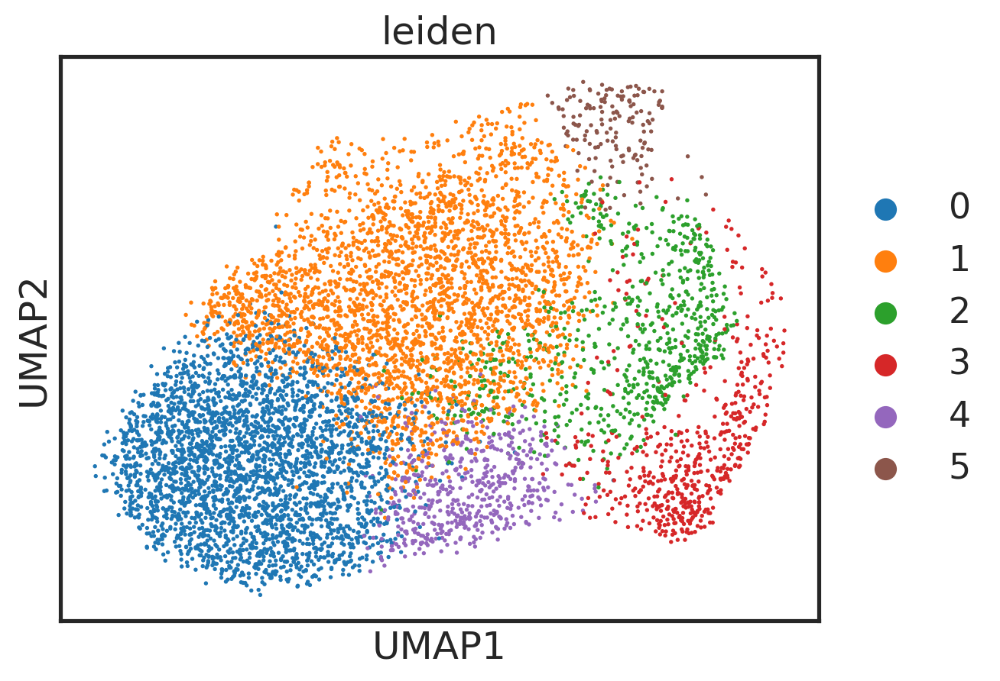

In [25]:
# Cluster the neighborhood graph using the Leiden algorithm
sc.tl.leiden(adata_merged, resolution=0.5)

# Compute UMAP for 2D visualization
sc.tl.umap(adata_merged)

# Plot the results
sc.pl.umap(adata_merged, color=['leiden'])

# first round of study individually

In [26]:
adata = adata_merged

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


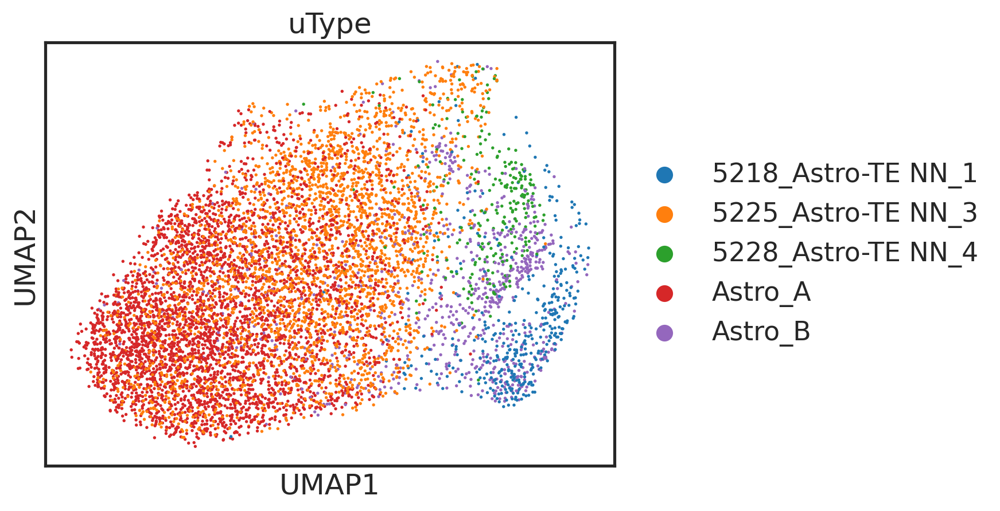

In [28]:
sc.pl.umap(adata, color=['uType'])

/u/home/f/f7xiesnm/.conda/envs/napari/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


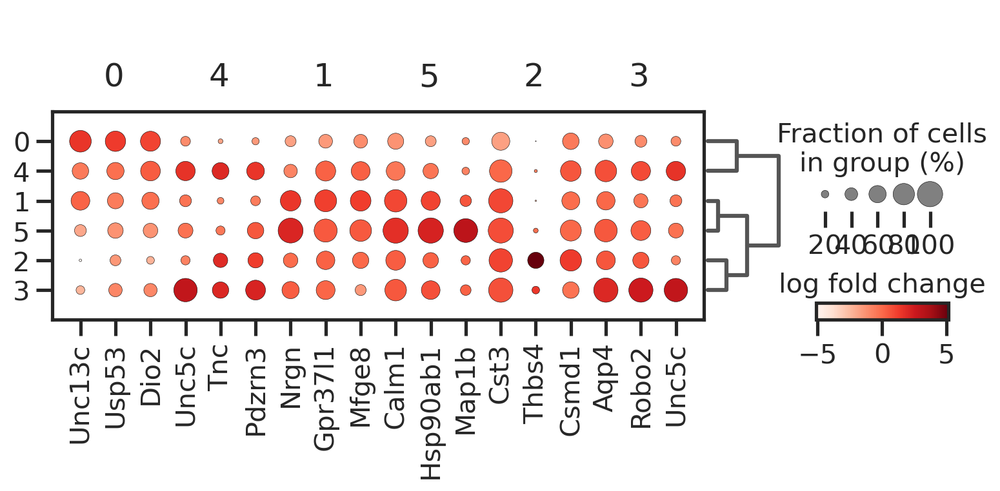

In [29]:
# Compute differential expression (Wilcoxon rank-sum test is default and robust)
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')

# View the top 5 genes for each cluster in a table
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
# pd.DataFrame({group: result['names'][group][:5] for group in groups})

# Plot the top 3 genes per cluster
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3, values_to_plot='logfoldchanges', min_logfoldchange=1)



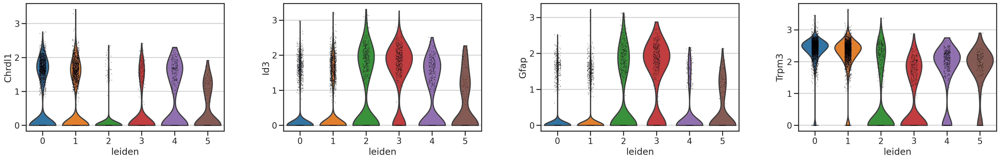

In [32]:
sc.pl.violin(adata, ['Chrdl1', 'Id3', 'Gfap', 'Trpm3'], groupby='leiden')

In [33]:
pc1 = adata.obsm['X_pca_harmony'][:,0]
pc2 = adata.obsm['X_pca_harmony'][:,1]
pc3 = adata.obsm['X_pca_harmony'][:,2]
dfviz = pd.DataFrame([pc1, pc2, pc3]).T

In [34]:
dfviz

,0,1,2
0,-0.116805,-1.249142,4.059956
1,-0.854057,-2.128165,-0.103658
2,-1.449967,-3.355595,1.621808
3,0.120373,-0.923632,1.983639
4,-0.343531,-1.733490,-0.840126
...,...,...,...
7922,-4.197657,-1.909295,-0.637262
7923,0.736838,6.834805,-0.167069
7924,4.733557,-3.620646,2.114924
7925,-3.112414,-0.493102,-0.543123


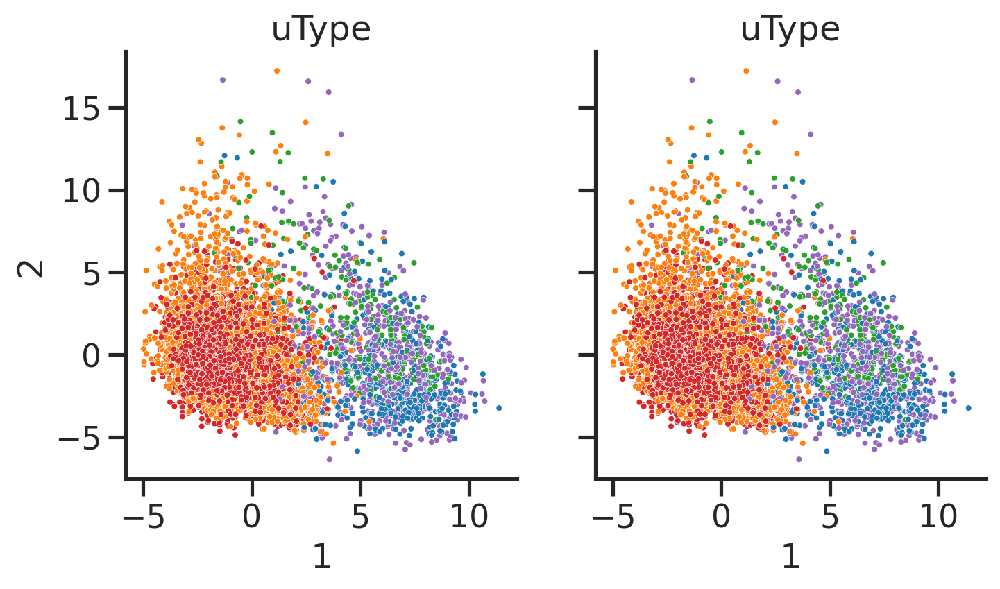

In [39]:
gns = ['uType', 'uType'] 

n = len(gns)
       
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    dfviz[gn] = adata.obs[gn].values
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, s=10, ax=ax, legend=False)
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

# Pan astrocyte and Classic astrocyte markers

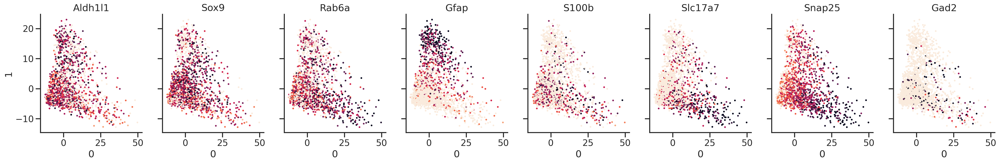

In [21]:
gns = ['Aldh1l1', 'Sox9', 'Rab6a', 'Gfap', 'S100b', 'Slc17a7', 'Snap25', 'Gad2', ]

n = len(gns)
       
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 98)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=0, y=1, hue=gn, palette='rocket_r', s=10, ax=ax, legend=False, 
                    edgecolor='none',
                   )
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

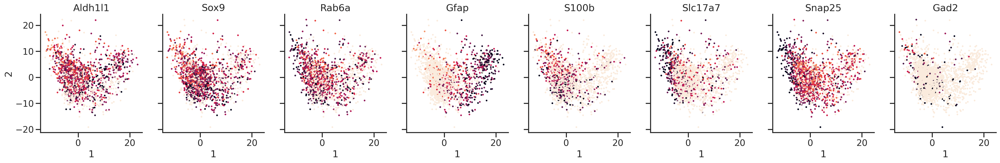

In [22]:

n = len(gns)
       
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 98)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, palette='rocket_r', s=10, ax=ax, legend=False, 
                    edgecolor='none',
                   )
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

# Refined markers

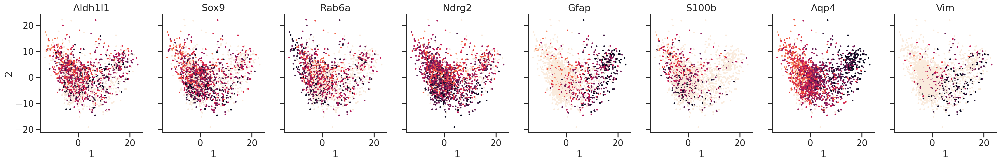

In [23]:
gns = ['Aldh1l1', 'Sox9', 'Rab6a', 'Ndrg2', 'Gfap', 'S100b', 'Aqp4', 'Vim']

n = len(gns)
       
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 98)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, palette='rocket_r', s=10, ax=ax, legend=False, 
                    edgecolor='none',
                   )
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

# reported subtypes of astrocytes

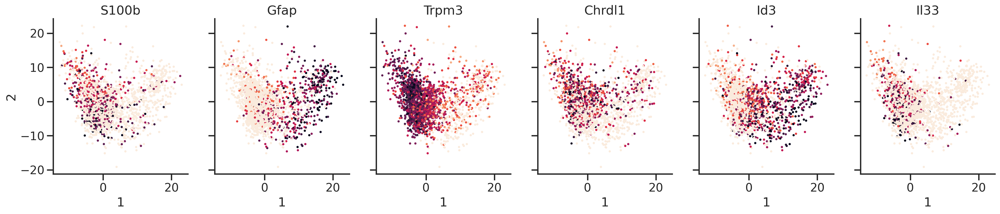

In [24]:
gns = ['S100b', 'Gfap', 'Trpm3', 'Chrdl1', 'Id3', 'Il33', ]

n = len(gns)
       
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 98)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, palette='rocket_r', s=10, ax=ax, legend=False, 
                    edgecolor='none',
                   )
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

# genes contributing to PC3

In [25]:
pc2_loadings = adata.varm['PCs'][:,2]

In [26]:
gidx = np.argsort(-np.abs(pc2_loadings))
goi = adata.var.index.values[gidx][:10]
goi

array(['Mt1', 'Ckb', 'Mt3', 'Fgf14', 'Aldoc', 'Wdr17', 'Clu', 'Gstm5',
       'Ppia', 'Slc8a1'], dtype=object)

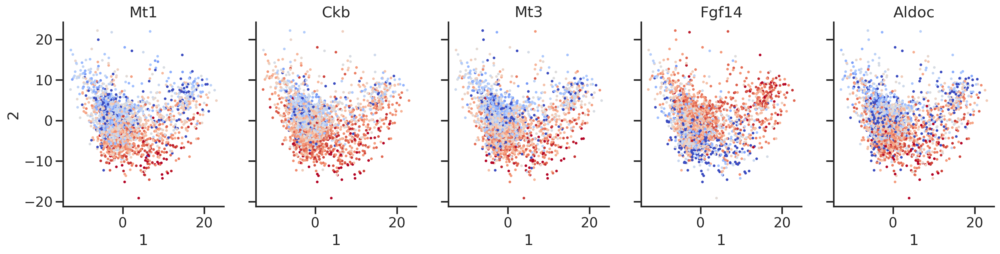

In [27]:
gns = goi[:5]
n = len(gns)
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 99)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, palette='coolwarm', s=10, ax=ax, legend=False, 
                    edgecolor='none')
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

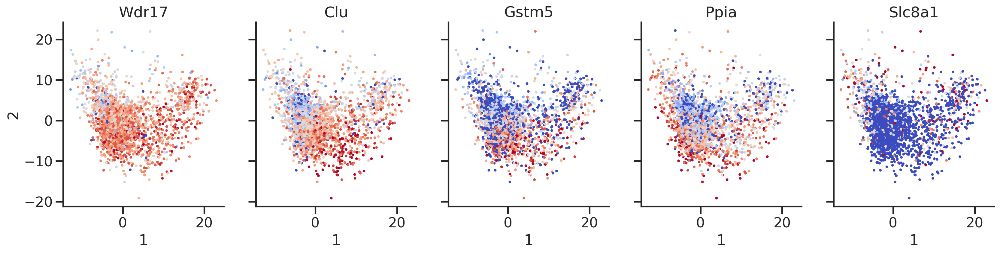

In [28]:
gns = goi[5:]
n = len(gns)
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 98)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, palette='coolwarm', s=10, ax=ax, legend=False, 
                    edgecolor='none',
                   )
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()

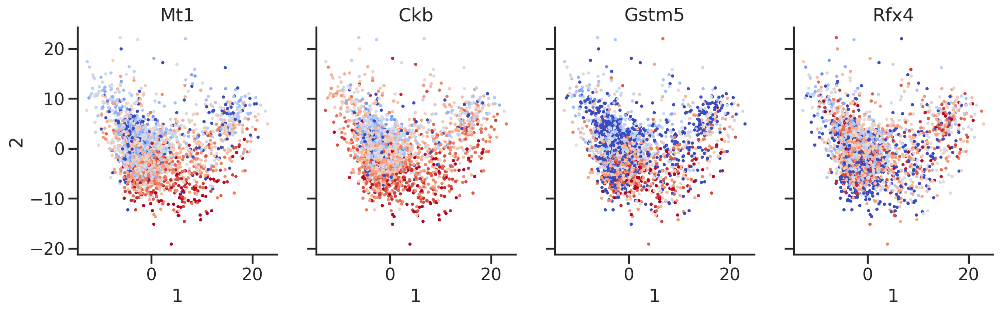

In [29]:

gns = ['Mt1', 'Ckb', 'Gstm5', 'Rfx4']
n = len(gns)
fig, axs = plt.subplots(1,n,figsize=(n*4,1*4), sharex=True, sharey=True)
for i, gn in enumerate(gns):
    ax = axs[i] 
    gexp = np.array(adata_ag[:,gn].X.todense()).reshape(-1,)
    vmax = np.percentile(gexp, 98)
    gexp = np.clip(gexp/vmax, 0, 1)
    dfviz[gn] = gexp
    
    sns.scatterplot(data=dfviz, x=1, y=2, hue=gn, palette='coolwarm', s=10, ax=ax, legend=False, 
                    edgecolor='none',
                   )
    ax.grid(False)
    ax.set_title(gn)
    sns.despine(ax=ax)
    
plt.show()